In [124]:
import missingno as mo
import pandas as pd
import numpy as np
import plotly as plotly
import plotly.plotly as py
import plotly.graph_objs as go
%matplotlib inline
import matplotlib.pyplot as plt
from scipy import ndimage
import geopandas
from geopandas.geodataframe import GeoDataFrame
from shapely.geometry import Point
from mpl_toolkits.basemap import Basemap
from matplotlib import cm
import seaborn as sns
import folium

In [204]:
#df = pd.read_csv('data_clean_N1.csv')
df = pd.read_csv('Assignment 2 Group 14\Cleaned road data\cleaned_roads_all\data_clean_all.csv')
df = df.loc[df['Add On Process'] == 'BridgesDelay']

In [205]:
df['Coordinates'] = list(zip(df.Lon, df.Lat))
df['Coordinates'] = df['Coordinates'].apply(Point)
gdf = GeoDataFrame(df, geometry='Coordinates')

In [206]:
gdf['Color'] = ''
for i in range(0,len(gdf)):
    if gdf.Cat.iloc[i] == 'A':
        gdf.Color.iloc[i] = 'green'
    if gdf.Cat.iloc[i] == 'B':
        gdf.Color.iloc[i] = 'yellow'
    if gdf.Cat.iloc[i] == 'C':
        gdf.Color.iloc[i] = 'orange'
    if gdf.Cat.iloc[i] == 'D':
        gdf.Color.iloc[i] = 'red'

In [207]:
#What categories do you want to show?
colorlist = ['red', 'orange', 'yellow', 'green'] #
gdfc = gdf.loc[gdf['Color'].isin(colorlist) ]

In [209]:
import re
this_map = folium.Map(tiles="cartodbpositron")

def popopHTMLString(point):
    '''input: a series that contains a url somewhere in it and generate html'''
    html = 'LRP: '
    html += '<a href="'
    html += point.LRPName
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.LRPName)[:45]  #to put a \ in front of any ' in the name
    html += ' </a>'
    
    html += ' <br>'
    html += 'Categorie: '
    html += '<a href="'
    html += point.Cat
    html += '"target="_blank">'
    html += re.sub(r"[']+", "\\\\'", point.Cat)
    html += ' </a>'
    
    return html

def plotDot(point):
    '''input: series that contains a numeric named latitude and a numeric named longitude
    this function creates a CircleMarker and adds it to your this_map'''
    htmlString = folium.Html(popopHTMLString(point), script=True)
    folium.CircleMarker(location=[point.Lat, point.Lon],
                        radius=3,
                        weight=2,#remove outline
                        popup = folium.Popup(htmlString),
                        color = point.Color,
                        fill_opacity=1,
                        line_opacity=1,
                        fill_color=point.Color).add_to(this_map)
#use df.apply(,axis=1) to iterate through every row in your dataframe
gdfc.apply(plotDot, axis = 1)

#Set the zoom to the maximum possible
this_map.fit_bounds(this_map.get_bounds())

#Save the map to an HTML file
this_map.save('BridgesN1All.html')

this_map

In [156]:
m = folium.Map(location=[21, 90], zoom_start=7, tiles="cartodbpositron")
for i in range(0,len(gdfc)):
    folium.Circle(
        location=[gdfc.iloc[i]['Lat'], gdfc.iloc[i]['Lon']],
        popup=gdfc.iloc[i]['LRPName'],
        radius=gdfc.iloc[i]['Chainage'],
        color=gdfc.iloc[i]['Color'],
        fill=True,
        fill_color=gdfc.iloc[i]['Color']
   ).add_to(m)
m
#m.save('N1Bridges.html')

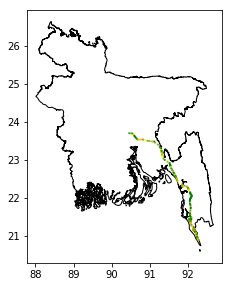

In [155]:
cmap = cm.get_cmap('Blues')
shp.crs = {'init': 'epsg:4326'}
gdf.crs = {'init': 'epsg:4326'}
fig, ax = plt.subplots(1, figsize=(3.5,7))
base = shp.plot(ax=ax, color='white', edgecolor='black')
gdf.plot(ax=base, markersize=1, color=gdf.Color, alpha=0.5)

In [111]:
m=Basemap(llcrnrlon=-160, llcrnrlat=-75,urcrnrlon=160,urcrnrlat=80)
m.drawmapboundary(fill_color='#A6CAE0', linewidth=0)
m.fillcontinents(color='grey', alpha=0.7, lake_color='grey')
m.drawcoastlines(linewidth=0.1, color="white")
m.plot(gdf['Lon'], gdf['Lat'], linestyle='none', marker="o", markersize=5, alpha=0.6, c="orange", markeredgecolor="black", markeredgewidth=1)

In [116]:
m = folium.Map(location=[21, 90], zoom_start=7, tiles="cartodbpositron")
m.choropleth(
    geo_data=gdf.Coordinates,
    color='red')
m

In [8]:
plt.figure()
shp = GeoDataFrame.from_file('bgd_admbnda_adm0_bbs_20180410/bgd_admbnda_adm0_bbs_20180410.shp')
gdf.plot(markersize=gdf.Chainage, c=gdf.Color,zorder = 0)
shp.plot(color='white',edgecolor='black',zorder = 5)
plt.show()

In [136]:
def heatmap(d, bins=(100,100), smoothing=1.3, cmap='jet'):
    def getx(pt):
        return pt.coords[0][0]

    def gety(pt):
        return pt.coords[0][1]

    x = list(d.geometry.apply(getx))
    y = list(d.geometry.apply(gety))
    heatmap, xedges, yedges = np.histogram2d(y, x, bins=bins)
    extent = [yedges[0], yedges[-1], xedges[-1], xedges[0]]

    logheatmap = np.log(heatmap)
    logheatmap[np.isneginf(logheatmap)] = 0
    logheatmap = ndimage.filters.gaussian_filter(logheatmap, smoothing, mode='nearest')
    
    plt.imshow(logheatmap, cmap=cmap, extent=extent)
    plt.colorbar()
    plt.gca().invert_yaxis()
    plt.show()

C:\Users\User\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: RuntimeWarning:

divide by zero encountered in log



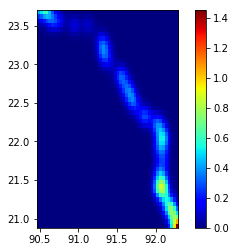

In [137]:
heatmap(gdf, bins=50, smoothing=1.5)

In [41]:
plotly.tools.set_credentials_file(username='rdregmans', api_key='prTIvmb4FIsJhJuvxQJg')